In [0]:
import torch
import numpy as np
import time
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
import matplotlib.pyplot as plt
from PIL import Image, ImageOps

#mount Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
#resize and black pad images to 224x224 with no distortion
def cleaner(file):
    #resize image while keeping aspect ratio (e.g. 500x375 becomes 224x168)
    x = 224
    y = 224
    image = Image.open(file).convert("RGB")
    image.thumbnail((x, y), Image.ANTIALIAS)

    #add symmetrical black padding to the smaller dimension to match the desired x and y
    deltaX = x - image.size[0]
    deltaY = y - image.size[1]
    padding = (deltaX//2, deltaY//2, deltaX-(deltaX//2), deltaY-(deltaY//2))

    return ImageOps.expand(image, padding)

#load images from Google Drive
def loadImages(folder):
    #transform to tensor and normalize
    transform = transforms.Compose([transforms.ToTensor(), 
                                    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225])])

    #load data from Google Drive and clean them as they load
    dataset = torchvision.datasets.ImageFolder(root=folder, loader=cleaner, transform=transform)
    
    return dataset

#verify that the images have been loaded and labeled
def verifyImages(dataset):
    #prepare dataloader
    dataLoader = torch.utils.data.DataLoader(dataset, batch_size=32, num_workers=1, shuffle=True)

    #verification step - obtain one batch of images
    dataiter = iter(dataLoader)
    images, labels = dataiter.next()
    images = images.numpy() #convert images to numpy for display
    classes = ["NotSnow", "Snow"]

    #plot the images in the batch, along with the corresponding labels
    fig = plt.figure(figsize=(25, 4))
    for idx in np.arange(6):
        ax = fig.add_subplot(2, 20/2, idx+1, xticks=[], yticks=[])
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        picture = np.transpose(images[idx], (1, 2, 0))
        picture = std * picture + mean
        picture = np.clip(picture, 0, 1)
        plt.imshow(picture)
        ax.set_title(classes[labels[idx]])

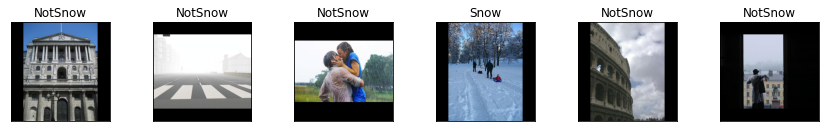

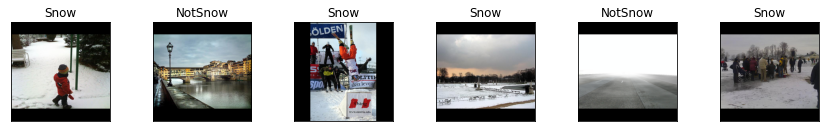

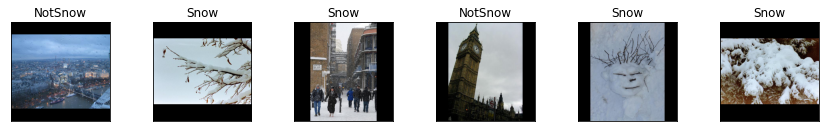

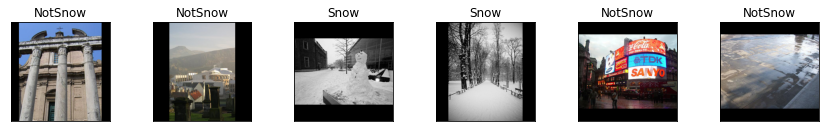

In [0]:
imagePath = "/content/gdrive/My Drive/Colab Notebooks/ProjectData/SnowData/"
overfitImages = loadImages(imagePath + "Overfit")
trainingImages = loadImages(imagePath + "Training")
validationImages = loadImages(imagePath + "Validation")
testingImages = loadImages(imagePath + "Testing")
verifyImages(overfitImages)
verifyImages(trainingImages)
verifyImages(validationImages)
verifyImages(testingImages)

In [0]:
import os
import torchvision.models
resnet50 = torchvision.models.resnet50(pretrained=True) #load ResNet50

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth


In [0]:
#save ResNet50 features on Google Drive
def saveFeatures(dataset, folder):
    #prepare dataloader with one of each loaded image
    dataLoader = torch.utils.data.DataLoader(dataset, batch_size=1, num_workers=1, shuffle=True)

    classes = ["NotSnow", "Snow"]
    n = 0
    for img, label in dataLoader:
        features = resnet50(img)
        #convert to numpy and back to tensor so PyTorch doesn't track updates to ResNet50 weights
        featuresTensor = torch.from_numpy(features.detach().numpy()) 

        #save features to folder as tensors
        folderName = folder + '/' + str(classes[label])
        if not os.path.isdir(folderName):
            os.mkdir(folderName)
        torch.save(featuresTensor.squeeze(0), folderName + '/' + str(n) + ".tensor")
        n += 1

#load the tensors from files on Google Drive
def loadFeatures(folder):
    dataset = torchvision.datasets.DatasetFolder(folder, loader=torch.load, extensions=('.tensor'))

    #prepare dataloader for verification
    featureLoader = torch.utils.data.DataLoader(dataset, batch_size=32, num_workers=1, shuffle=True)

    #verification step - obtain one batch of features
    dataiter = iter(featureLoader)
    features, labels = dataiter.next()
    print(features.shape)
    print(labels.shape)

    return dataset

featurePath = "/content/gdrive/My Drive/Colab Notebooks/ProjectData/SnowData/Features/"

In [0]:
#run this once to save the ResNet50 features to Google Drive
startTime = time.time()
saveFeatures(overfitImages, featurePath + "Overfit")
saveFeatures(trainingImages, featurePath + "Training")
saveFeatures(validationImages, featurePath + "Validation")
saveFeatures(testingImages, featurePath + "Testing")
print("Saved the features in {:.3f} seconds".format(time.time() - startTime))

Saved the features in 992.374 seconds


In [0]:
#load the features for training
overfitFeatures = loadFeatures(featurePath + "Overfit")
trainingFeatures = loadFeatures(featurePath + "Training")
validationFeatures = loadFeatures(featurePath + "Validation")
testingFeatures = loadFeatures(featurePath + "Testing")

torch.Size([32, 1000])
torch.Size([32])
torch.Size([32, 1000])
torch.Size([32])
torch.Size([32, 1000])
torch.Size([32])
torch.Size([32, 1000])
torch.Size([32])


In [0]:
class SnowClassifier(nn.Module):
    def __init__(self, fcSize, getFeatures=False, useCuda=True):
        self.size = fcSize
        self.getFeatures = getFeatures
        self.useCuda = useCuda
        super(SnowClassifier, self).__init__()
        self.fc1 = nn.Linear(1000, self.size)
        self.fc2 = nn.Linear(self.size, self.size//2)
        self.fcf = nn.Linear(self.size//2, 1)

    def forward(self, x):
        if self.getFeatures:
            if self.useCuda:
                x = resnet50.cuda()(x)
            else:
                x = resnet50(x)
        x = x.view(-1, 1000)
        x = F.leaky_relu(self.fc1(x))
        x = F.leaky_relu(self.fc2(x))
        x = self.fcf(x)
        return x.squeeze(1)

#Generate a name for the model consisting of all the hyperparameter values
def getModelName(size=320, batchSize=500, learningRate=0.0008, epoch=29):
    return "/content/gdrive/My Drive/Colab Notebooks/ProjectData/SnowData/Models/size{0}_bs{1}_lr{2}_epoch{3}".format(size, batchSize, learningRate, epoch)

#using the trained neural network, evaluate its performance on a data set
def evaluate(net, loader, criterion=nn.BCEWithLogitsLoss(), testing=False, showImages=False):
    totalLoss = 0
    totalAcc = 0
    total0Acc = 0
    total1Acc = 0
    total0 = 0
    total1 = 0
    totalEpoch = 0

    for i, data in enumerate(loader, 0):
        #get the inputs
        inputs, labels = data

        if showImages:
            images = inputs.numpy() #convert images to numpy for display
        
        if torch.cuda.is_available():
            inputs = inputs.cuda()
            labels = labels.cuda()

        #get the predictions
        outputs = net(inputs)

        #evaluate the loss and accuracy
        loss = criterion(outputs, labels.float())
        cacc = (outputs > 0).squeeze().long() == labels
        
        #evaluate true positives and true negatives
        cfalse = 0
        ctrue = 0
        if testing:
            for i, output in enumerate(outputs.squeeze(), 0):
                if labels[i].item() == 0:
                    total0 += 1
                    if output.item() <= 0:
                        cfalse += 1
                elif labels[i].item() == 1:
                    total1 += 1
                    if output.item() > 0:
                        ctrue += 1

        totalAcc += int(cacc.sum())
        totalLoss += loss.item()
        totalEpoch += len(labels)
        total0Acc += cfalse
        total1Acc += ctrue
        
        #print the images, their labels and whether the model was correct or not
        if showImages:
            classes = ["NotSnow", "Snow"]
            #plot the pictures, labels and if the model got it right
            fig = plt.figure(figsize=(25,  4 * (len(labels)//10+1)))
            for idx in range(len(labels)):
                ax = fig.add_subplot(len(labels)//10+1, 10, idx+1, xticks=[], yticks=[])
                mean = np.array([0.485, 0.456, 0.406])
                std = np.array([0.229, 0.224, 0.225])
                picture = np.transpose(images[idx], (1, 2, 0))
                picture = std * picture + mean
                picture = np.clip(picture, 0, 1)
                plt.imshow(picture)
                guess = int(outputs.squeeze()[idx].item() > 0)
                if guess == labels[idx].item():
                    isCorrect = ' O'
                else:
                    isCorrect = ' X'
                ax.set_title(classes[labels[idx].item()] + isCorrect)
    
    #calculate the final accuracy and loss
    acc = float(totalAcc) / totalEpoch
    loss = float(totalLoss) / (i + 1)
    if not testing:
        return acc, loss
    else:
        return acc, total0Acc, total1Acc, total0, total1

#Plots the training curve for a model run, given the csv files
#containing the train/validation accuracy/loss.
def plotTrainingCurve(path):
    import matplotlib.pyplot as plt
    trainAcc = np.loadtxt("{}_train_acc.csv".format(path))
    valAcc = np.loadtxt("{}_val_acc.csv".format(path))
    trainLoss = np.loadtxt("{}_train_loss.csv".format(path))
    valLoss = np.loadtxt("{}_val_loss.csv".format(path))
    plt.title("Train vs Validation Accuracy")
    n = len(trainAcc) # number of epochs
    plt.plot(range(1,n+1), trainAcc, label="Train")
    plt.plot(range(1,n+1), valAcc, label="Validation")
    plt.axis([0, n+1, 0, 1]) 
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend(loc='best')
    plt.show()
    plt.title("Train vs Validation Loss")
    plt.plot(range(1,n+1), trainLoss, label="Train")
    plt.plot(range(1,n+1), valLoss, label="Validation")
    plt.axis([0, n+1, 0, max(max(valLoss), max(trainLoss))+0.1]) 
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend(loc='best')
    plt.show()

def train(net, trainSet, valSet, batchSize, learningRate, numEpochs, verbose=1, saveModel=False):
    # Fixed PyTorch random seed for reproducible result
    torch.manual_seed(1000)

    #load the data
    trainLoader = torch.utils.data.DataLoader(trainSet, batch_size=batchSize, num_workers=1, shuffle=True)
    valLoader = torch.utils.data.DataLoader(valSet, batch_size=batchSize, num_workers=1, shuffle=True)

    # Define the Loss function and optimizer
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(net.parameters(), lr=learningRate)

    # Set up some numpy arrays to store the training/test loss/accuracy
    trainAcc = np.zeros(numEpochs)
    trainLoss = np.zeros(numEpochs)
    valAcc = np.zeros(numEpochs)
    valLoss = np.zeros(numEpochs)

    # Train the network
    # Loop over the data iterator and sample a new batch of training data
    # Get the output from the network, and optimize our loss function.
    startTime = time.time()
    maxTrainingAccuracy = 0
    bestTrainingEpoch = 1
    maxValidationAccuracy = 0
    bestValidationEpoch = 1

    #optional progress bar
    if verbose == 1:
        print("Start|", end = "")
        for i in range(numEpochs-2):
            print(" ", end = "")
        print("|Finish")
        print("     ", end = "")

    net.train()
    for epoch in range(numEpochs):  # loop over the dataset multiple times
        totalTrainLoss = 0.0
        totalTrainAcc = 0.0
        totalEpoch = 0

        for i, data in enumerate(trainLoader, 0):
            # Get the inputs
            inputs, labels = data
            if torch.cuda.is_available():
                inputs = inputs.cuda()
                labels = labels.cuda()

            # Zero the parameter gradients
            optimizer.zero_grad()

            # Forward pass, backward pass, and optimize
            outputs = net(inputs)
            loss = criterion(outputs, labels.float())
            loss.backward()
            optimizer.step()

            # Calculate the statistics
            cacc = (outputs > 0).squeeze().long() == labels
            totalTrainAcc += int(cacc.sum())
            totalTrainLoss += loss.item()
            totalEpoch += len(labels)

        #Calculate the accuracy and loss
        trainAcc[epoch] = float(totalTrainAcc) / totalEpoch
        trainLoss[epoch] = float(totalTrainLoss) / (i+1)
        net.eval()
        valAcc[epoch], valLoss[epoch] = evaluate(net, valLoader, criterion)
        net.train()

        #update the highest accuracy
        if maxTrainingAccuracy < trainAcc[epoch]:
            maxTrainingAccuracy = trainAcc[epoch]
            bestTrainingEpoch = epoch + 1
        if maxValidationAccuracy < valAcc[epoch]:
            maxValidationAccuracy = valAcc[epoch]
            bestValidationEpoch = epoch + 1
        
        #optional: print out the progress
        if verbose == 2:
            print(("Epoch {}: Train acc: {}, Train loss: {} |"+
                "Validation acc: {}, Validation loss: {}").format(
                    epoch + 1,
                    trainAcc[epoch],
                    trainLoss[epoch],
                    valAcc[epoch],
                    valLoss[epoch]))
        elif verbose == 1:
            print("|", end = "")
          
        # Save the current model (checkpoint) to a file if needed
        modelPath = getModelName(net.size, batchSize, learningRate, epoch)
        if saveModel:
            torch.save(net.state_dict(), modelPath)
    
    #print the stats
    if verbose > 0:
        print('\nFinished Training')
        print("Best Training Accuracy:", maxTrainingAccuracy, "at epoch", bestTrainingEpoch)
        print("Best Validation Accuracy:", maxValidationAccuracy, "at epoch", bestValidationEpoch)
        endTime = time.time()
        elapsedTime = endTime - startTime
        print("Total time elapsed: {:.3f} seconds".format(elapsedTime))

    # Write the train/test loss/acc into CSV file for plotting later
    np.savetxt("{}_train_acc.csv".format(modelPath), trainAcc)
    np.savetxt("{}_train_loss.csv".format(modelPath), trainLoss)
    np.savetxt("{}_val_acc.csv".format(modelPath), valAcc)
    np.savetxt("{}_val_loss.csv".format(modelPath), valLoss)

    return maxValidationAccuracy, bestValidationEpoch

Training with CUDA
Start|                                                          |Finish
     ||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||
Finished Training
Best Training Accuracy: 1.0 at epoch 58
Best Validation Accuracy: 1.0 at epoch 57
Total time elapsed: 12.632 seconds


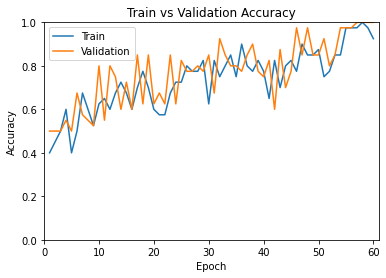

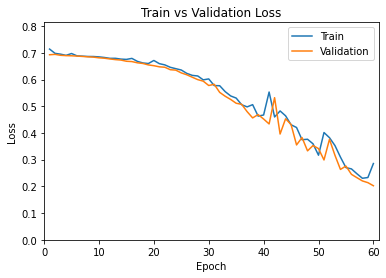

In [0]:
size = 320
batchSize = 20
learningRate = 0.0005
epochs = 60

model = SnowClassifier(size)
if torch.cuda.is_available():
    print("Training with CUDA")
    model = model.cuda()
train(model, overfitFeatures, overfitFeatures, batchSize, learningRate, epochs)
plotTrainingCurve(getModelName(size, batchSize, learningRate, epochs-1))

In [0]:
size = 750
batchSize = 30
learningRate = 0.00075
epochs = 50

model = SnowClassifier(size)
if torch.cuda.is_available():
    print("Training with CUDA")
    model = model.cuda()
train(model, trainingFeatures, validationFeatures, batchSize, learningRate, epochs, verbose=1, saveModel=False)
plotTrainingCurve(getModelName(size, batchSize, learningRate, epochs-1))

Training with CUDA
Start|                                                |Finish
     ||||||||||||||||||||||||||||||||||||||||||||||||||
Finished Training
Best Training Accuracy: 0.8174655285620486 at epoch 49
Best Validation Accuracy: 0.7584830339321357 at epoch 50
Total time elapsed: 160.722 seconds


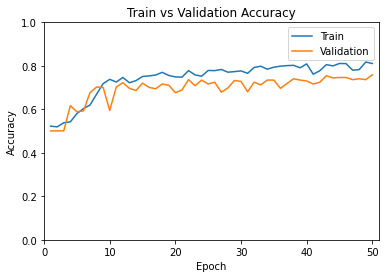

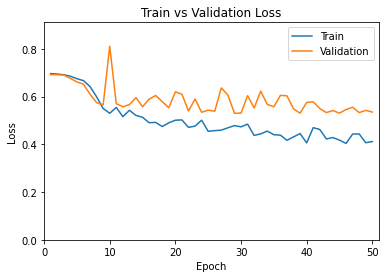

In [0]:
size = 750
batchSize = 30
learningRate = 0.0007
epochs = 50

model = SnowClassifier(size)
if torch.cuda.is_available():
    print("Training with CUDA")
    model = model.cuda()
train(model, trainingFeatures, validationFeatures, batchSize, learningRate, epochs, verbose=1, saveModel=True)
plotTrainingCurve(getModelName(size, batchSize, learningRate, epochs-1))

In [0]:
import random
start = time.time()
epochs = 50
bestAcc = 0
bestEpoch = 0
bestSize = 0
bestBatchSize = 0
bestLR = 0
i = 0
while True:
    i += 1
    size = random.randrange(20, 900, 10)
    batchSize = random.randrange(30, 250, 10)
    learningRate = random.randrange(1, 21)/10000

    model = SnowClassifier(size)
    if torch.cuda.is_available():
        model = model.cuda()
    acc, epoch = train(model, trainingFeatures, validationFeatures, batchSize, learningRate, epochs, verbose=0)

    if acc > bestAcc:
        bestAcc = acc
        bestEpoch = epoch
        bestSize = size
        bestBatchSize = batchSize
        bestLR = learningRate
        print("Val Accuracy {:.4f}".format(bestAcc), "with fc size", bestSize, "batch size", bestBatchSize, "and LR", bestLR, "at epoch", bestEpoch)

print("Trained", i, "models")
plotTrainingCurve(getModelName(bestSize, bestBatchSize, bestLR, epochs-1))

In [0]:
size = 750
batchSize = 30
learningRate = 0.0007
epoch = 49

model = SnowClassifier(size)
if torch.cuda.is_available():
    model = model.cuda()
model.load_state_dict(torch.load(getModelName(size, batchSize, learningRate, epoch)))
testLoader = torch.utils.data.DataLoader(testingFeatures, batch_size=batchSize, num_workers=1, shuffle=True)
acc, acc0, acc1, total0, total1 = evaluate(model, testLoader, nn.BCEWithLogitsLoss(), True)
print(acc)
print(acc0)
print(acc1)
print(total0)
print(total1)

0.7455268389662028
194
181
252
251


0.7475149105367793


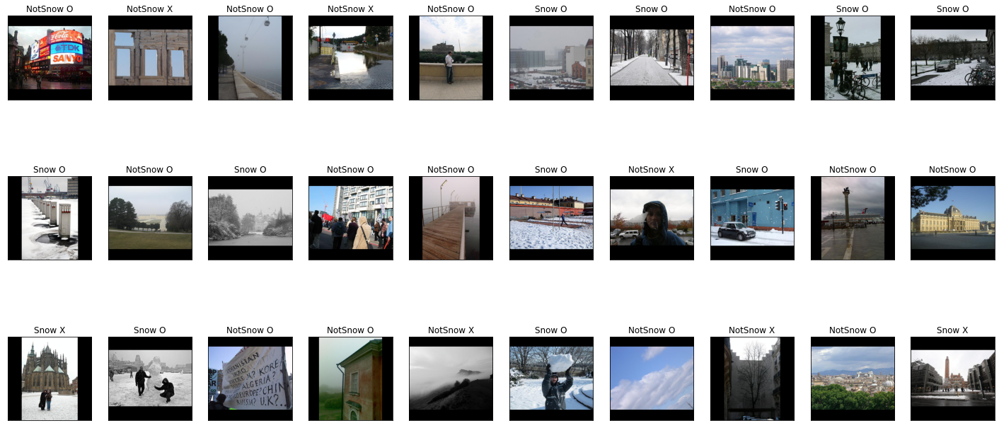

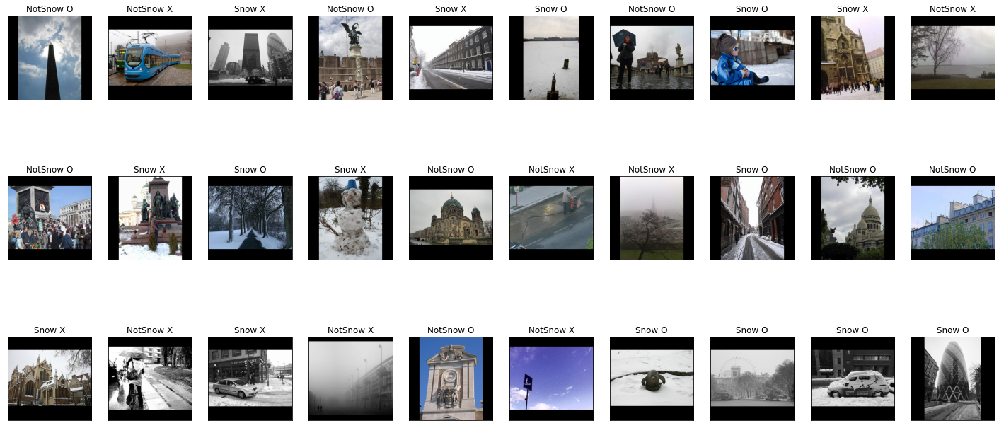

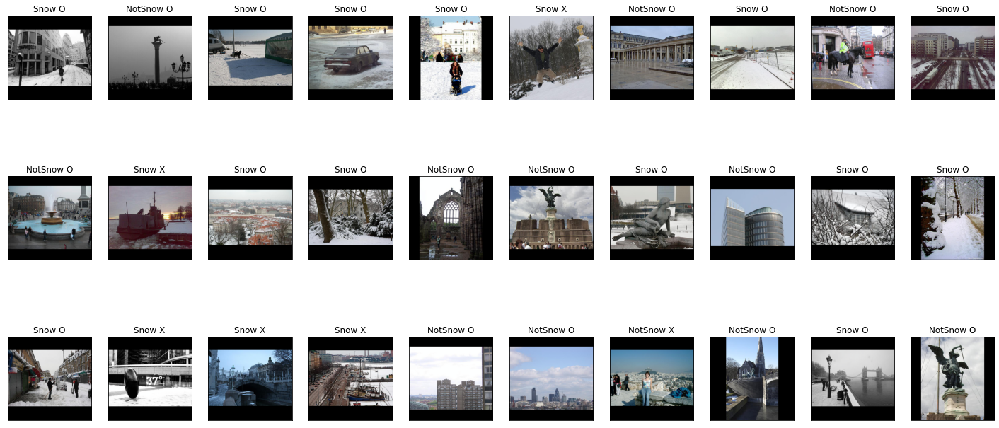

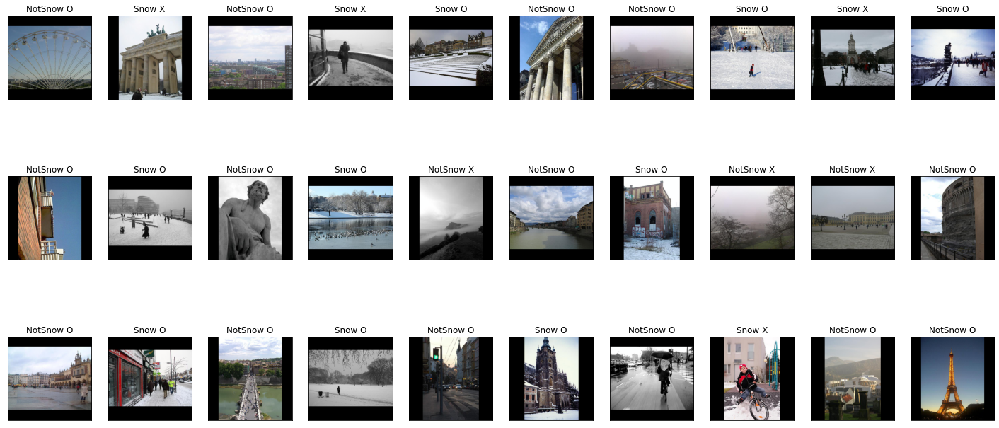

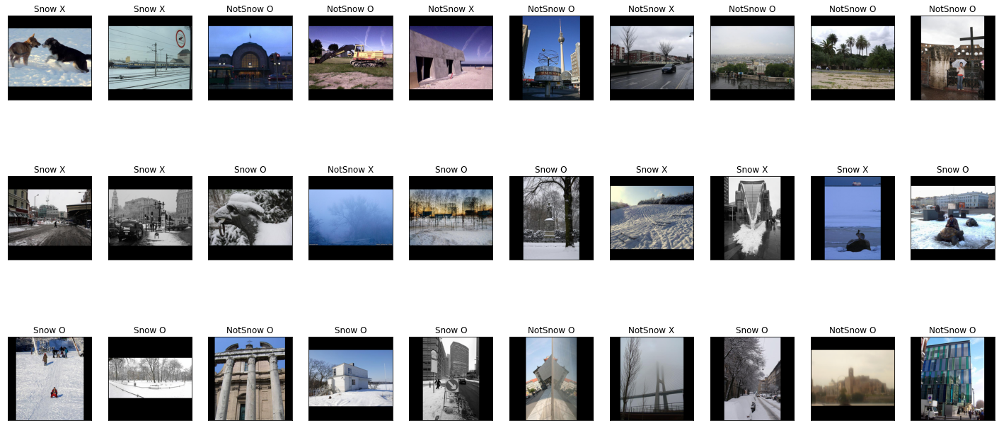

...

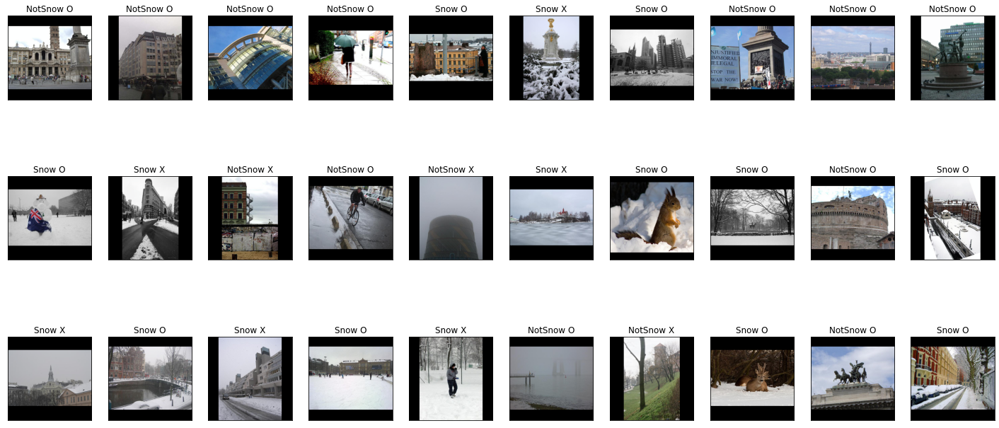

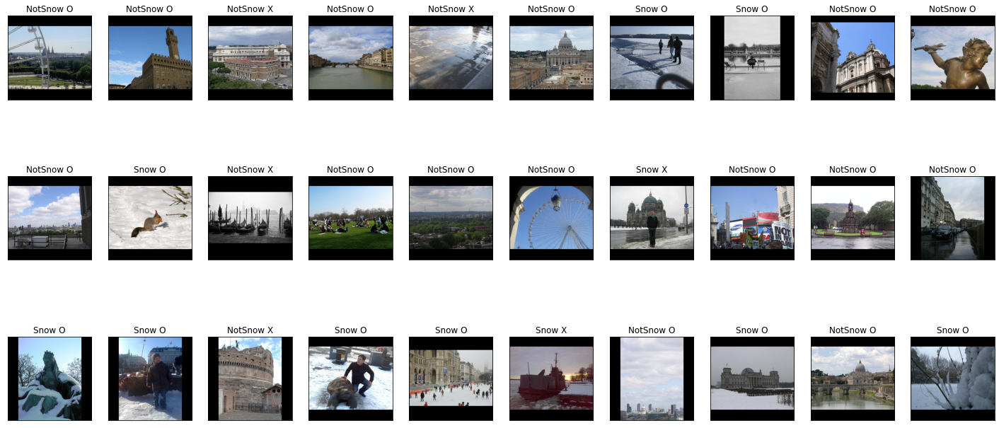

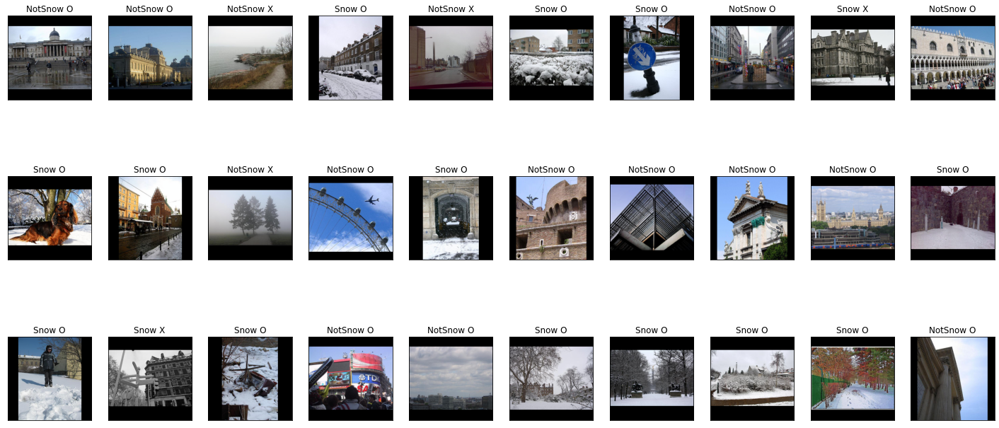

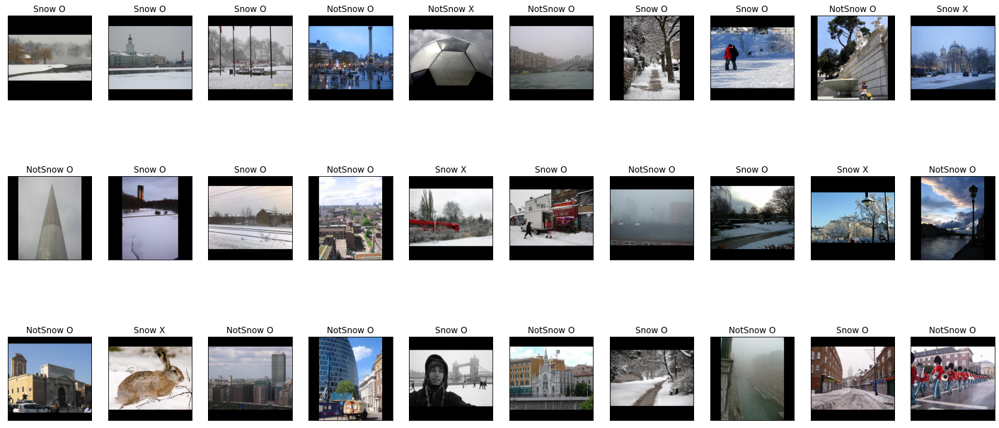

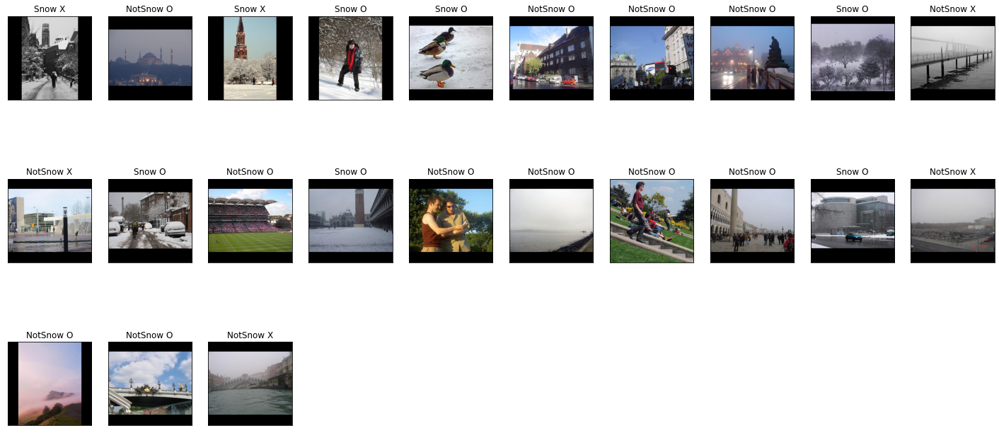

In [0]:
size = 750
batchSize = 30
learningRate = 0.0007
epoch = 49

model = SnowClassifier(size, True)
if torch.cuda.is_available():
    model = model.cuda()
model.load_state_dict(torch.load(getModelName(size, batchSize, learningRate, epoch)))
testLoader = torch.utils.data.DataLoader(testingImages, batch_size=batchSize, num_workers=1, shuffle=True)
acc, loss = evaluate(model, testLoader, nn.BCEWithLogitsLoss(), True, True)
print(acc)